# Identifying members of the ATLAS Aliqa-Uma stream with a Bayesian mixture model

Written by Andrew Li | June 2023 (Updated April 2024)

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits
from astropy import table
import matplotlib

import emcee
import corner

from collections import OrderedDict
import time

from scipy import optimize, stats

In [12]:
font = {'size'   : 16}

matplotlib.rc('font', **font)

## 1 -  Background

Stellar streams are pretty much what they sound like: a stream of stars across the sky. They are generated when a smaller stellar structure, such as a dwarf galaxy or globular cluster, undergoes immense tidal stripping from a more messive stellar structure, such as a galaxy. The progenitor essentially gets stretched into a line that spans a great distance. Due to the nature of its creation, it is important that we learn as much as we can about these structures, as they reveal key information about the formation of the galaxy and its history, dark matter structure, and much more.

One of the first steps in this process is to determine which stars are part of a stellar stream. Surveys of these streams often return thousands of stars spanning many degrees, of which only a few are likely to be members of a stellar stream. Despite this, it is expected that these stars share similar properties, namely their values in radial velocity, metalicity, and proper motion. Consequently, we can model the data relatively well using a mixture model, with a **stream** component, and a **background** component. More on this will be discussed later.

ATLAS Aliqa-Uma (AAU) is a stellar stream in the Milky Way. Originially, this stream was considered to be two seperate streams. ATLAS was discovered in 2014, and Aliqa-Uma later in 2018. Due to the different alignments, they were considered to be two different streams in close proximity, but [Li et al. 2021](https://ui.adsabs.harvard.edu/abs/2021ApJ...911..149L/abstract) theorized that the similar radial velocities and proper motions of the members suggests that they are the same stream that was later misaligned by the LMC. Members were also determiend spectroscopically in this paper. Now, with newer data, this tutorial aims to determine additional members of this stream using a different method: Bayesian statistics.

## 2 -  Data

The [Southern Stellar Stream Spectroscopic Survey](https://s5collab.github.io/) (S5) has completed surveys on 20 of these streams in the Milky Way. This tutorial will use the latest S5 data from an internal data set updated March 2024, imported below. The proper motions used are from Gaia DR3.

In [13]:
# S5 data

table_S5_full = table.Table.read('/raid/S5/idr3/cat_s5_dr3.7.fits')

The observed fields are also shown

In [14]:
# S5 regions
for i in np.unique(table_S5_full['object_name']):
    print(i)

300S
Aliqa-Uma
Antlia2
Atlas
BootesI
Chenab
Crater2
Elqui
Fornax
GD-1
Hercules
Indus
Jet
Jhelum
Kgo4
Kgo5
NGC1261
NGC1851
NGC1904
NGC3201
NGC4590
NGC5897
NGC6316
NGC7078
NGC7089
Ophiuchus
Orphan
Pal13
Pal15
Pal5
Phlegethon
Phoenix
Ravi
SMCNOD
Sgr
Styx
Tuc2
Tuc3e
TurbioNew
Turranburra
Volans
Wambelong
Willka-Yaku
epod


The members of AAU identified in Li et al. 2021 can also be imported.

In [15]:
# Members in Li+2021
with fits.open('../data/all_streams_DR3_v7_snr5_McMillan17Best.fits') as hdu_list:
    table_members = table.Table(hdu_list[1].data)

# Previous results regions
for i in np.unique(table_members['regionname']):
    print(i)

300S
AAU
Chenab
Elqui
Indus
Jet
Jhelum
Ophiuchus
Orphan
Palca
Phoenix
Sgr
Turranburra
WillkaYaku


We now select all of the AAU data and display the table. We can see that there are 9593 (previously 9963 in 3.5) observed stars.

In [16]:
# Selecting stream members

stream_data_temp = table_S5_full[(table_S5_full['object_name'] == 'Atlas')|(table_S5_full['object_name'] == 'Aliqa-Uma')]
stream_mem = table_members[table_members['regionname'] == 'AAU']

stream_data_temp

vel_blue1,vel_blue16,vel_blue50,vel_blue84,vel_blue99,vel_blue_mean,vel_blue_std,vel_blue_kurt,vel_blue_skew,vel1,vel16,vel50,vel84,vel99,vel_mean,vel_std,vel_kurt,vel_skew,teff1,teff16,teff50,teff84,teff99,teff_mean,teff_std,teff_kurt,teff_skew,logg1,logg16,logg50,logg84,logg99,logg_mean,logg_std,logg_kurt,logg_skew,feh1,feh16,feh50,feh84,feh99,feh_mean,feh_std,feh_kurt,feh_skew,alpha1,alpha16,alpha50,alpha84,alpha99,alpha_mean,alpha_std,alpha_kurt,alpha_skew,name,field,ra,dec,utmjd,comment,fig_name,proc_file_list,input_cat_rowids,nspec_580v,nspec_1700d,utmjd_mean,prior_type,chisq_580v_0,chisq_1700d_0,redchisq_580v_0,redchisq_1700d_0,chisq_cont_580v_0,chisq_cont_1700d_0,sn_580v_0,sn_1700d_0,absdev_580v_0,absdev_1700d_0,fname,chisq_580v_1,redchisq_580v_1,chisq_cont_580v_1,sn_580v_1,absdev_580v_1,chisq_580v_2,redchisq_580v_2,chisq_cont_580v_2,sn_580v_2,absdev_580v_2,chisq_1700d_1,redchisq_1700d_1,chisq_cont_1700d_1,sn_1700d_1,absdev_1700d_1,chisq_1700d_2,redchisq_1700d_2,chisq_cont_1700d_2,sn_1700d_2,absdev_1700d_2,chisq_580v_3,chisq_1700d_3,redchisq_580v_3,redchisq_1700d_3,chisq_cont_580v_3,chisq_cont_1700d_3,sn_580v_3,sn_1700d_3,absdev_580v_3,absdev_1700d_3,chisq_580v_4,chisq_580v_5,chisq_580v_6,chisq_1700d_4,chisq_1700d_5,chisq_1700d_6,redchisq_580v_4,redchisq_580v_5,redchisq_580v_6,redchisq_1700d_4,redchisq_1700d_5,redchisq_1700d_6,chisq_cont_580v_4,chisq_cont_580v_5,chisq_cont_580v_6,chisq_cont_1700d_4,chisq_cont_1700d_5,chisq_cont_1700d_6,sn_580v_4,sn_580v_5,sn_580v_6,sn_1700d_4,sn_1700d_5,sn_1700d_6,absdev_580v_4,absdev_580v_5,absdev_580v_6,absdev_1700d_4,absdev_1700d_5,absdev_1700d_6,chisq_580v_7,redchisq_580v_7,chisq_cont_580v_7,sn_580v_7,absdev_580v_7,ebv,gaia_source_id,dr2_source_id,phot_bp_rp_excess_factor,parallax,parallax_error,phot_g_mean_mag,source_id,pmra,pmdec,pmra_error,pmdec_error,pmra_pmdec_corr,phot_bp_mean_mag,phot_rp_mean_mag,r_med_geo,r_lo_geo,r_hi_geo,r_med_photogeo,r_lo_photogeo,r_hi_photogeo,bjdist_flag,w1mpro,w2mpro,w1sigmpro,w2sigmpro,j_2mass,h_2mass,k_2mass,u_skm,e_u_skm,v_skm,e_v_skm,g_skm,e_g_skm,r_skm,e_r_skm,i_skm,e_i_skm,z_skm,e_z_skm,starhorse_dist05,starhorse_dist16,starhorse_dist50,starhorse_dist84,starhorse_dist95,decam_g,decam_r,decam_i,decam_z,decam_phot_src_bits,qso_flag_wise,priority,object_name,sesar_s3ab,sesar_s3c,gaia_rr,p_bhb_decals,best_chisq_580v,best_absdev_580v,best_sn_580v,best_redchisq_580v,best_chisq_cont_580v,best_chisq_1700d,best_absdev_1700d,best_sn_1700d,best_redchisq_1700d,best_chisq_cont_1700d,good_star_pb,good_star,vel_calib,vel_calib_std,feh_calib_std
float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,bytes19,bytes19,float64,float64,float64,bytes35,bytes44,bytes686,bytes90,int64,int64,float64,bytes5,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,bytes19,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float32,int64,int64,float32,float64,float32,float32,int64,float64,float64,float32,float32,float32,float32,float32,float64,float64,float64,float64,float64,float64,bytes20,float32,float32,float32,float32,float32,float32,float32,float64,float64,float64,float64,float64,float64,float64,float64,float64,floa

### 2.1 - Stream coordinates

A useful change of coordinates is from equatorial (RA,Dec) to stream ($\phi_1$,$\phi_2$). This is accomplished by what is essentially a 3-d rotation that places $(0,0)$ at the center of the stream, with the stream's orbit parallel to the $\phi_1$ axis. This change of coordinates is defined in [Shipp et al. 2019](https://iopscience.iop.org/article/10.3847/1538-4357/ab44bf) and the following function is used. This change of coordinates allows for easier modelling and visualization. Proper motions ($\mu_\alpha\cos\delta$,$\mu_\delta$) can also be converted into coordinates ($\mu_{\phi_1}\cos\phi_2$,$\mu_{\phi_2}$), but this will not be covered in this tutorial.

In [17]:
def phi12_rotmat(alpha,delta,R_phi12_radec):
    '''
    Converts coordinates (alpha,delta) to ones defined by a rotation matrix R_phi12_radec, applied on the original coordinates

    Critical: All angles must be in degrees
    
    Parameters:
    alpha - float. Right ascension
    delta - float. Declination
    R_phi12_radec - 3x3 array. Rotation matrix
    
    Returns:
    [phi1,phi2] - the transformed stream coordinates as a size 2 array.
    '''
    
    vec_radec = np.array([np.cos(alpha*np.pi/180.)*np.cos(delta*np.pi/180.),
                          np.sin(alpha*np.pi/180.)*np.cos(delta*np.pi/180.),
                          np.sin(delta*np.pi/180.)])

    vec_phi12 = np.zeros(np.shape(vec_radec))
    
    vec_phi12[0] = np.sum(R_phi12_radec[0][i]*vec_radec[i] for i in range(3))
    vec_phi12[1] = np.sum(R_phi12_radec[1][i]*vec_radec[i] for i in range(3))
    vec_phi12[2] = np.sum(R_phi12_radec[2][i]*vec_radec[i] for i in range(3))
    
    vec_phi12 = vec_phi12.T

    vec_phi12 = np.dot(R_phi12_radec,vec_radec).T

    phi1 = np.arctan2(vec_phi12[:,1],vec_phi12[:,0])*180./np.pi
    phi2 = np.arcsin(vec_phi12[:,2])*180./np.pi

    return [phi1,phi2]

The rotation matrix can be acquired from the following imported file. ATLAS is chosen since it is longer than Aliqa-Uma. Also note that Jet and 300S are not included in this file.

In [18]:
import yaml
from collections import OrderedDict as odict
stream_lst = odict(yaml.safe_load(open('../data/streams_v6.0.yaml'))[0])

sname = 'ATLAS'
smatrix = stream_lst[sname]['matrix']

Now we convert.

In [19]:
# Convert equatorial to stream

table_S5_full['phi1'], table_S5_full['phi2'] = phi12_rotmat(table_S5_full['ra'],table_S5_full['dec'],smatrix)
stream_data_temp['phi1'], stream_data_temp['phi2'] = phi12_rotmat(stream_data_temp['ra'],stream_data_temp['dec'],smatrix)
stream_mem['phi1'], stream_mem['phi2'] = phi12_rotmat(stream_mem['ra'],stream_mem['dec'],smatrix)

/tmp/ipykernel_96332/3158834505.py:22: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  vec_phi12[0] = np.sum(R_phi12_radec[0][i]*vec_radec[i] for i in range(3))
/tmp/ipykernel_96332/3158834505.py:23: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  vec_phi12[1] = np.sum(R_phi12_radec[1][i]*vec_radec[i] for i in range(3))
/tmp/ipykernel_96332/3158834505.py:24: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  vec_phi12[2] = np.sum(R_phi12_radec[2][i]*vec_radec[i] for i in range(3))


Below, we can see the transformation.

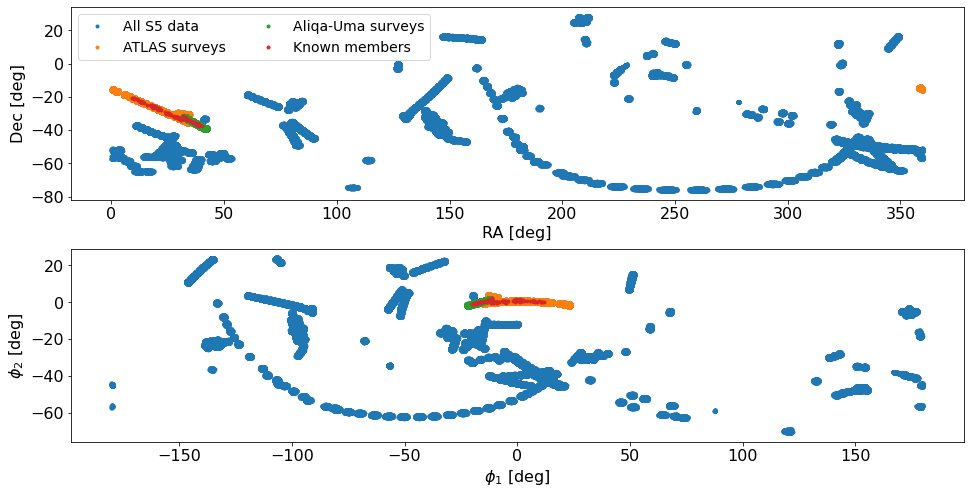

In [20]:
fig, ax = plt.subplots(2,1,figsize=(16,8))

atlas_cond = stream_data_temp['object_name'] == 'Atlas'
au_cond = stream_data_temp['object_name'] == 'Aliqa-Uma'

ax[0].plot(table_S5_full['ra'],table_S5_full['dec'],'.',label='All S5 data')
ax[0].plot(stream_data_temp[atlas_cond]['ra'],stream_data_temp[atlas_cond]['dec'],'.',label='ATLAS surveys')
ax[0].plot(stream_data_temp[au_cond]['ra'],stream_data_temp[au_cond]['dec'],'.',label='Aliqa-Uma surveys')
ax[0].plot(stream_mem['ra'],stream_mem['dec'],'.',label='Known members')
ax[0].set(xlabel="RA [deg]", ylabel="Dec [deg]")
ax[0].legend(ncol=2,loc=2,prop={'size':14})

ax[1].plot(table_S5_full['phi1'],table_S5_full['phi2'],'.')
ax[1].plot(stream_data_temp[atlas_cond]['phi1'],stream_data_temp[atlas_cond]['phi2'],'.')
ax[1].plot(stream_data_temp[au_cond]['phi1'],stream_data_temp[au_cond]['phi2'],'.')
ax[1].plot(stream_mem['phi1'],stream_mem['phi2'],'.')
ax[1].set(xlabel="$\phi_1$ [deg]", ylabel="$\phi_2$ [deg]")

plt.subplots_adjust(hspace=0.25)

Now we choose a range for both $\phi_1$ and $\phi_2$ to consider, outlined below by the black box. This will vary by stream and can be completed by eye.

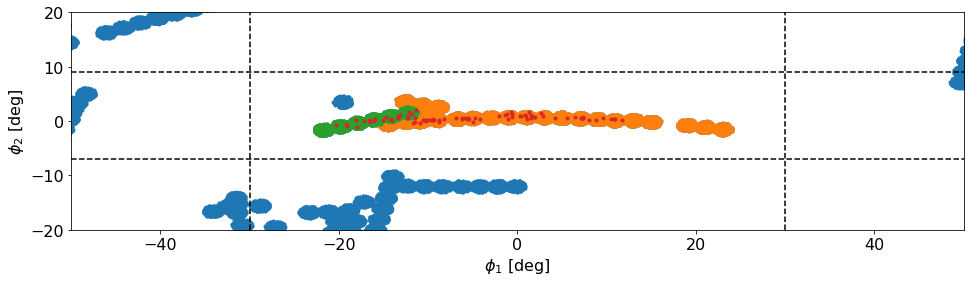

In [21]:
fig, ax = plt.subplots(figsize=(16,4))


ax.plot(table_S5_full['phi1'],table_S5_full['phi2'],'.')
ax.plot(stream_data_temp[atlas_cond]['phi1'],stream_data_temp[atlas_cond]['phi2'],'.')
ax.plot(stream_data_temp[au_cond]['phi1'],stream_data_temp[au_cond]['phi2'],'.')
ax.plot(stream_mem['phi1'],stream_mem['phi2'],'.')
ax.set(xlabel="$\phi_1$ [deg]", ylabel="$\phi_2$ [deg]")
ax.set(xlabel="$\phi_1$ [deg]", ylabel="$\phi_2$ [deg]",xlim=(-50,50),ylim=(-20,20))

plt.axhline(-7,color='k',ls='--')
plt.axhline(9,color='k',ls='--')
plt.axvline(-30,color='k',ls='--')
plt.axvline(30,color='k',ls='--')

In [22]:
stream_data = table_S5_full[((table_S5_full['phi1'] > -30)&(table_S5_full['phi1'] < 30)
                            &(table_S5_full['phi2'] > -7)&(table_S5_full['phi2'] < 9))]

### 2.2 - Convert heliocentric velocity to the GSR frame

We will also convert the velocity measurements, which are heliocentric, to be with respect to the Galactic Standard of Rest (GSR). This will be accomplised using code found [here](https://docs.astropy.org/en/stable/generated/examples/coordinates/rv-to-gsr.html), where the corodinates used for transformation are also available. This transformationremove solar motion, which also allows for easier analysis.

In [23]:
def rv_to_gsr(c, v_sun=None):
    """Transform a barycentric radial velocity to the Galactic Standard of Rest
    (GSR).

    The input radial velocity must be passed in as a

    Parameters
    ----------
    c : `~astropy.coordinates.BaseCoordinateFrame` subclass instance
        The radial velocity, associated with a sky coordinates, to be
        transformed.
    v_sun : `~astropy.units.Quantity`, optional
        The 3D velocity of the solar system barycenter in the GSR frame.
        Defaults to the same solar motion as in the
        `~astropy.coordinates.Galactocentric` frame.

    Returns
    -------
    v_gsr : `~astropy.units.Quantity`
        The input radial velocity transformed to a GSR frame.

    """
    if v_sun is None:
        v_sun = coord.Galactocentric().galcen_v_sun.to_cartesian()

    gal = c.transform_to(coord.Galactic)
    cart_data = gal.data.to_cartesian()
    unit_vector = cart_data / cart_data.norm()

    v_proj = v_sun.dot(unit_vector)

    return c.radial_velocity + v_proj

In [24]:
import astropy.coordinates as coord
import astropy.units as u
coord.galactocentric_frame_defaults.set('latest')


#Convert
icrs = coord.SkyCoord(ra=stream_data['ra']*u.deg, dec=stream_data['dec']*u.deg,
                      radial_velocity=stream_data['vel_calib']*u.km/u.s, frame='icrs')
stream_data['vgsr'] = rv_to_gsr(icrs)


icrs = coord.SkyCoord(ra=stream_mem['ra']*u.deg, dec=stream_mem['dec']*u.deg,
                      radial_velocity=stream_mem['vel_calib']*u.km/u.s, frame='icrs')
stream_mem['vgsr'] = rv_to_gsr(icrs)

Again, we can view the transformation.

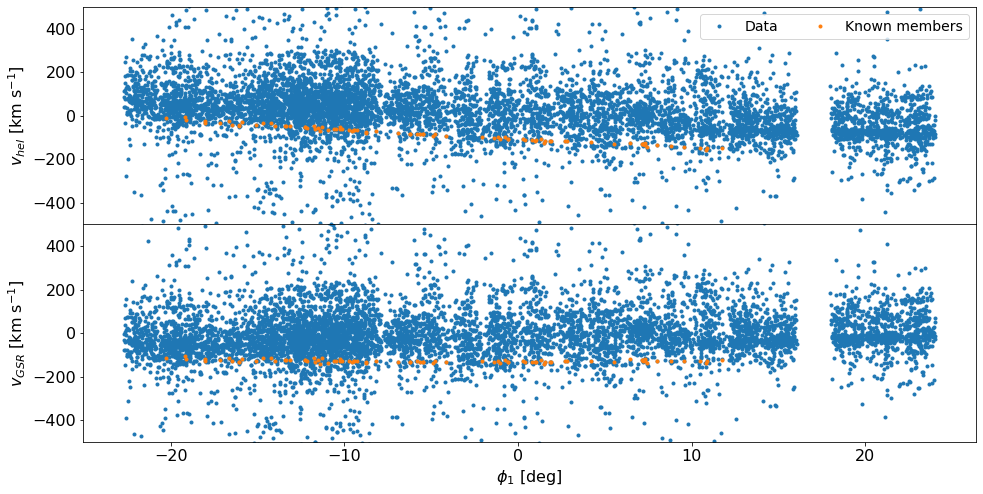

In [25]:
fig, ax = plt.subplots(2,1,figsize=(16,8))

ax[0].plot(stream_data['phi1'], stream_data['vel_calib'],'.',label='Data')
ax[0].plot(stream_mem['phi1'], stream_mem['vel_calib'],'.',label='Known members')
ax[0].set_ylim(-500,500)
ax[0].set_ylabel('$v_{hel}$ [km s$^{-1}$]')
ax[0].legend(ncol=2,loc=1,prop={'size':14})

ax[1].plot(stream_data['phi1'], stream_data['vgsr'],'.')
ax[1].plot(stream_mem['phi1'], stream_mem['vgsr'],'.')
ax[1].set(xlabel='$\phi_1$ [deg]',ylabel='$v_{GSR}$ [km s$^{-1}$]',ylim=(-500,500))

plt.subplots_adjust(hspace=0)

### 2.3 - Data cuts

Now, we must remove data we do not wish to consider, such as poor quality, large uncertainties, or extreme values in rv, feh, or pm far away from the known members. We are left with 5143 members after this process.

In [26]:
# Data cuts

quality_cuts = (stream_data['feh50'] < 0.5) \
               & (stream_data['vgsr'] < 250) & (stream_data['vgsr'] > -250) \
               & (stream_data['pmra'] < 9) & (stream_data['pmra'] > -5) \
               & (stream_data['pmdec'] < 5) & (stream_data['pmdec'] > -9) \
               & (stream_data['vel_calib_std'] < 20) & (stream_data['feh_calib_std'] < 1) \
               & (stream_data['good_star'] == 1)

stream_data_red = stream_data[quality_cuts]

# stars before and after cut
print(len(stream_data),len(stream_data_red))

9780 5143


We can display the remaining data and make estimates for stream properties (blue lines).

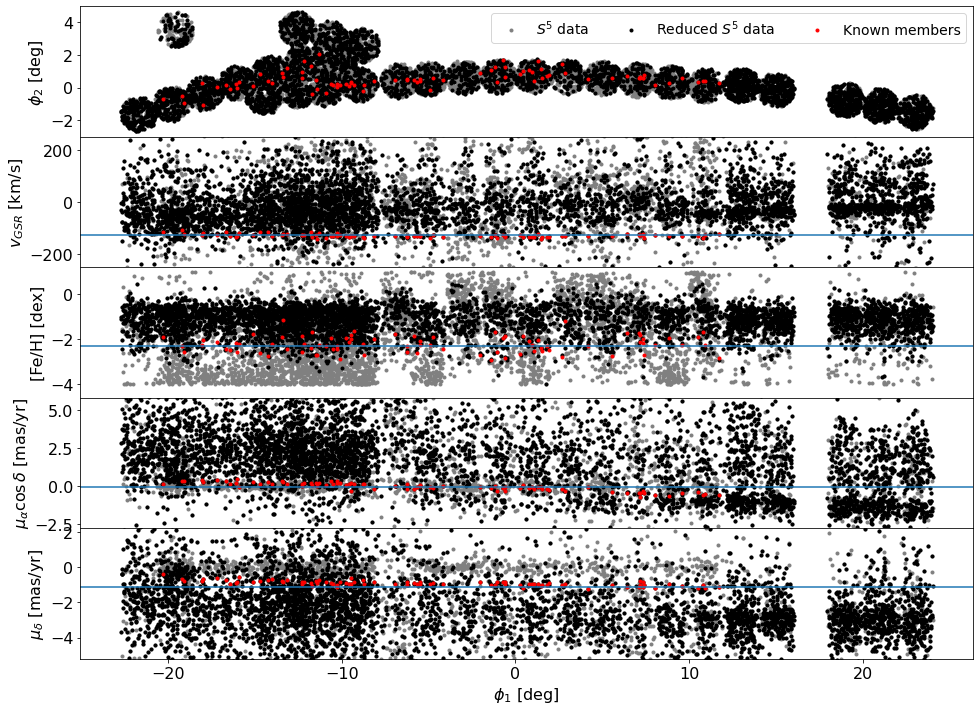

In [27]:
fig, ax = plt.subplots(5,1,figsize=(16,12),sharex=True)

ax[0].plot(stream_data['phi1'], stream_data['phi2'],'.',color='grey',label='$S^5$ data')
ax[0].plot(stream_data_red['phi1'], stream_data_red['phi2'],'.',color='k',label='Reduced $S^5$ data')
ax[0].plot(stream_mem['phi1'], stream_mem['phi2'],'.',color='r',label='Known members')

ax[1].plot(stream_data['phi1'], stream_data['vgsr'],'.',color='grey')
ax[1].plot(stream_data_red['phi1'], stream_data_red['vgsr'],'.',color='k')
ax[1].plot(stream_mem['phi1'], stream_mem['vgsr'],'.',color='r')

ax[2].plot(stream_data['phi1'], stream_data['feh50'],'.',color='grey')
ax[2].plot(stream_data_red['phi1'], stream_data_red['feh50'],'.',color='k')
ax[2].plot(stream_mem['phi1'], stream_mem['feh50'],'.',color='r')

ax[3].plot(stream_data['phi1'], stream_data['pmra'],'.',color='grey')
ax[3].plot(stream_data_red['phi1'], stream_data_red['pmra'],'.',color='k')
ax[3].plot(stream_mem['phi1'], stream_mem['pmra'],'.',color='r')

ax[4].plot(stream_data['phi1'], stream_data['pmdec'],'.',color='grey')
ax[4].plot(stream_data_red['phi1'], stream_data_red['pmdec'],'.',color='k')
ax[4].plot(stream_mem['phi1'], stream_mem['pmdec'],'.',color='r')

ax[0].legend(ncol=3,loc=1,prop={'size':14})

ax[0].set_ylabel('$\phi_2$ [deg]')
ax[1].set(ylabel=r'$v_{GSR}$ [km/s]',ylim=(-250,250))
ax[2].set(ylabel=r'[Fe/H] [dex]',ylim=(-4.6,1.2))
ax[3].set(ylabel=r'$\mu_{\alpha} \cos\delta$ [mas/yr]',ylim=(-2.8,5.8))
ax[4].set(xlabel="$\phi_1$ [deg]",ylabel='$\mu_\delta$ [mas/yr]',ylim=(-5.2,2.2))

ax[1].axhline(-125)
ax[2].axhline(-2.3)
ax[3].axhline(-0.1)
ax[4].axhline(-1.1)
plt.subplots_adjust(hspace=0)

## 3 - Modelling

Now, we must construct a model. As stated before, we will have a stream and background component, each with contributions from `vgsr`, `feh50`, `pmra`, and `pmdec`. `vgsr` and `feh50` will be modelled as 1-d Gaussians, while `pmra` and `pmdec` will be combined with `pmra_pmdec_corr` to be modelled as a 2-d Gaussian. Additionally, the means for the stream component will be a quadratic function of $x=\phi_1/10^\circ$. The weights of the stream and background component will be determined by the parameter `pstream`, the fraction of stars expected to be in the stream. These 23 parameters are summarized below.

Parameters:
- pstream - fraction of stars in stream
- v1, v2, v3 - vgsr track coeffecitents (v1 + v2\*x + v3\*x^2)
- lsigv - log10 vgsr dispersion
- feh1 - metallicity value
- lsigfeh - log10 feh dispersion
- pmra1, pmra2, pmra3 - pmra track coeffecitents
- lsigpmra - log10 pmra dispersion
- pmdec1, pmdec2, pmdec3 - pmdec track coeffecitents
- lsigpmra - log10 pmra dispersion
- bv, lsigbv, bfeh, lsigbfeh, bpmra, lsigbpmra, bpmdec, lsigbpmdec - similar components for the background, no phi1 dependence

Additional components can also be added to this GMM, to better represent the data or fit additional physical structures that you want identified.

In [28]:
param_labels = ["pstream",
                "v1","v2","v3","lsigv",
                "feh1","lsigfeh",
                "pmra1","pmra2","pmra3","lsigpmra",
                "pmdec1","pmdec2","pmdec3","lsigpmdec",
                "bv", "lsigbv", "bfeh", "lsigbfeh", "bpmra", "lsigbpmra", "bpmdec", "lsigbpmdec"]

We will also define the `quad_f` function for conveience, and the function `logpdf_2dnorm`$^*$, which is the log of the pdf function for a 2d Gaussian. This is necessary as scipy's `multivariate_normal` is extremely slow comparitavely (~12x), not to mention the need to construct a covariance matrix. A function to construct an Ordered Dictionary is also constructed.

$^*$*(I did calculate this function using matrix multiplication by hand, so there might be errors, but the test cases I ran were identical to scipy to the 15th decimal place, and I haven't noticed any issues with it and compares similarily to 1-d pms case)*

In [29]:
def quad_f(phi,c1,c2,c3):
    '''
    Quadratic function
    
    Parameters are all floats, returns a float
    '''
    x = phi/10
    return c1 + c2*x + c3*x**2

def logpdf_2dnorm(x1,x2,m1,m2,s1,s2,c):
    v11 = s1**2
    v22 = s2**2
    v12 = c*s1*s2
    detcov = (1-c**2)*v11*v22
    d1 = x1 - m1
    d2 = x2 - m2
    
    a = ((2*np.pi)**(-1)) * (detcov**(-1/2))
    b = (-1/2)*(1/detcov)*(d2*(d2*v11-d1*v12)+d1*(d1*v22-d2*v12))
    return np.log(a) + b

def get_paramdict(theta):
    '''Make an ordered dictionary of the parameters as keys and inputted theta as values'''
    return OrderedDict(zip(param_labels, theta))

### 3.1 - The probability function

The MCMC sampler we are using will be `Ensemble_Sampler()` from `emcee`. For this, we must contruct a probability function (`lnprob`), which is the product of the likelihood and the prior. We will also be using the log of these distributions from this point onwards.

The prior will simply be a bunch of hard cutoffs. Essentially, if any one parameter falls outside of the prior, we return a very small value for `lnprob`. At this step, it is very important to (at minimum) set `0 < pstream < 1` otherwise errors will occur in the following code. We also set stricter restrictions for `v1`,`feh1`, `pmra1`, and `pmdec1`, otherwise there may be strange results. Expect to change the prior a lot based on parameter results, as sometimes there will be problems like bimodal chains or too restricting.

The likelihood function will be the sums of the logpdfs of vgsr, feh, and pm for each component, then the stream and background components will be scaled by `pstream` and `1-pstream` respectively and added together as well.

In [30]:
def lnprob(theta, vgsr, vgsr_err, feh, feh_err, pmra, pmra_err, pmdec, pmdec_err, phi1, pmcorr):
    """ Likelihood and Prior """
    
    # params
    pstream, \
    v1, v2, v3, lsigv, \
    feh1, lsigfeh, \
    pmra1, pmra2, pmra3, lsigpmra, \
    pmdec1, pmdec2, pmdec3, lsigpmdec, \
    bv, lsigbv, bfeh, lsigbfeh, bpmra, lsigbpmra, bpmdec, lsigbpmdec = theta
    
    # The prior
    if (pstream > 1) or (pstream < 0) or \
        (lsigv > 4) or (lsigfeh > 4) or (lsigpmra > 3) or (lsigpmdec > 3) or \
        (lsigv < -1) or (lsigfeh < -2) or (lsigpmra < -2) or (lsigpmdec < -3) or \
        (lsigbv > 4) or (lsigbfeh > 3) or (lsigbpmra > 3) or (lsigbpmdec > 3) or \
        (lsigbv < -1) or (lsigbfeh < -1) or (lsigbpmra < -2) or (lsigbpmdec < -2) or \
        (v1 > -100) or (v1 < -160) or (v2 > 5) or (v2 < -5) or (v3 > 10) or (5 < -5) or \
        (feh1 > 0) or (feh1 < -4) or \
        (pmra1 > 2) or (pmra1 < -2) or (pmra2 > 1) or (pmra2 < -1) or (pmra3 > 1) or (pmra3 < -1) or \
        (pmdec1 > 0) or (pmdec1 < -2) or (pmdec2 > 1) or (pmdec2 < -1) or (pmdec3 > 1) or (pmdec3 < -1) or \
        (bv > 50) or (bv < -50) or (bfeh > 1) or (bfeh < -5) or (bpmra > 2) or (bpmra < 0) or (bpmdec > 0) or (bpmdec < -4):
        return -1e10 # outside of prior, return a tiny number
    
    ## Compute log likelihood in v_gsr
    lstream_v = stats.norm.logpdf(vgsr, loc=quad_f(phi1,v1,v2,v3), scale=np.sqrt(vgsr_err**2+(10**lsigv)**2))
    lbg_v = stats.norm.logpdf(vgsr, loc=bv, scale=np.sqrt(vgsr_err**2+(10**lsigbv)**2))
    
    ## Compute log likelihood in feh
    lstream_feh = stats.norm.logpdf(feh, loc=feh1, scale=np.sqrt(feh_err**2+(10**lsigfeh)**2))
    lbg_feh = stats.norm.logpdf(feh, loc=bfeh, scale=np.sqrt(feh_err**2+(10**lsigbfeh)**2))
    
    ## Compute log likelihood in pm
    
    lstream_pm = logpdf_2dnorm(pmra,pmdec,
                               quad_f(phi1,pmra1,pmra2,pmra3),quad_f(phi1,pmdec1,pmdec2,pmdec3),
                               np.sqrt(pmra_err**2+(10**lsigpmra)**2),np.sqrt(pmdec_err**2+(10**lsigpmdec)**2),
                               pmcorr)
    lbg_pm = logpdf_2dnorm(pmra,pmdec,
                               bpmra,bpmdec,
                               np.sqrt(pmra_err**2+(10**lsigbpmra)**2),np.sqrt(pmdec_err**2+(10**lsigbpmdec)**2),
                               pmcorr)

    ## Combine the components
    lstream = np.log(pstream) + lstream_v + lstream_feh + lstream_pm
    lbg = np.log(1-pstream) + lbg_v + lbg_feh + lbg_pm
    ltot = np.logaddexp(lstream, lbg)
    
    return np.sum(ltot)

### 3.2 - Visualization

It is very important to check whether the parameter values make sense. For this, we use two functions that help us visualize the distirbutions in `vgsr`, `feh50`, `pmra`, and `pmdec`. The code is rather self explanatory. Note that when displaying the 1-d distributions, it is difficult to display the quadratic track, so the mean is shown to be the constant term (`v1`,`pmra1`,`pmdec1`).

In [31]:
def project_model(theta, vgsr_min, vgsr_max, feh_min, feh_max, pmra_min, pmra_max, pmdec_min, pmdec_max):
    """ Turn parameters into vgsr, pmra, pmdec distributions. An aproximation since no phi dependence"""
    params = get_paramdict(theta)
    
    vgsr_arr = np.linspace(vgsr_min, vgsr_max, 1000)
    feh_arr = np.linspace(feh_min, feh_max, 1000)
    pmra_arr = np.linspace(pmra_min, pmra_max, 1000)
    pmdec_arr = np.linspace(pmdec_min, pmdec_max, 1000)
    
    pvgsr0 = params['pstream']*stats.norm.pdf(vgsr_arr, loc=params['v1'], scale=10**params['lsigv'])
    pvgsr1 = (1-params['pstream'])*stats.norm.pdf(vgsr_arr, loc=params['bv'], scale=10**params['lsigbv'])
    
    pfeh0 = params['pstream']*stats.norm.pdf(feh_arr, loc=params['feh1'], scale=10**params['lsigfeh'])
    pfeh1 = (1-params['pstream'])*stats.norm.pdf(feh_arr, loc=params['bfeh'], scale=10**params['lsigbfeh'])
    
    ppmra0 = params['pstream']*stats.norm.pdf(pmra_arr, loc=params['pmra1'], scale=10**params['lsigpmra'])
    ppmra1 = (1-params['pstream'])*stats.norm.pdf(pmra_arr, loc=params['bpmra'], scale=10**params['lsigbpmra'])
    
    ppmdec0 = params['pstream']*stats.norm.pdf(pmdec_arr, loc=params['pmdec1'], scale=10**params['lsigpmdec'])
    ppmdec1 = (1-params['pstream'])*stats.norm.pdf(pmdec_arr, loc=params['bpmdec'], scale=10**params['lsigbpmdec'])
    
    return vgsr_arr, pvgsr0, pvgsr1, feh_arr, pfeh0, pfeh1, pmra_arr, ppmra0, ppmra1, pmdec_arr, ppmdec0, ppmdec1

def plot_1d_distrs(theta):
    '''
    Plots the distributions of vgsr, feh, pmra, pmdec
    '''
    colors = list(plt.rcParams["axes.prop_cycle"].by_key()["color"])
    model_output = project_model(theta,-300,300,-4.5,1,-5,10,-10,5)
    
    
    fig, axes = plt.subplots(2,2,figsize=(14,14))
    
    #vgsr
    ax = axes[0][0]
    ax.hist(stream_data_red['vgsr'], density=True, color='lightgrey', bins=50)
    xp, p0, p1 = model_output[0:3]
    ax.plot(xp, p0 + p1, 'k-', label='total', lw=3)
    ax.plot(xp, p1, ':', color=colors[1], label='bg', lw=3)
    ax.plot(xp, p0, ':', color=colors[0], label='stream', lw=3)
    ax.set_xlabel('vgsr')
    ax.legend(fontsize='small')

    # pmra
    ax = axes[0][1]
    ax.hist(stream_data_red['feh50'], density=True, color='lightgrey', bins=50)
    xp, p0, p1 = model_output[3:6]
    ax.plot(xp, p0 + p1, 'k-', lw=3)
    ax.plot(xp, p1, ':', color=colors[1], lw=3)
    ax.plot(xp, p0, ':', color=colors[0], lw=3)
    ax.set_xlabel('feh')
    
    # pmra
    ax = axes[1][0]
    ax.hist(stream_data_red['pmra'], density=True, color='lightgrey', bins=50)
    xp, p0, p1 = model_output[6:9]
    ax.plot(xp, p0 + p1, 'k-', lw=3)
    ax.plot(xp, p1, ':', color=colors[1], lw=3)
    ax.plot(xp, p0, ':', color=colors[0], lw=3)
    ax.set_xlabel('pmra')
    
    # pmdec
    ax = axes[1][1]
    ax.hist(stream_data_red['pmdec'], density=True, color='lightgrey', bins=50)
    xp, p0, p1 = model_output[9:12]
    ax.plot(xp, p0 + p1, 'k-', lw=3)
    ax.plot(xp, p1, ':', color=colors[1], lw=3)
    ax.plot(xp, p0, ':', color=colors[0], lw=3)
    ax.set_xlabel('pmdec')
    return fig

## 4 - Sampling

There are three main steps in this process, each more time consuming and sensitive than the last. Because of this, we must be certain that our results are good at each step.

Understanding MCMC is a bit our of the scope for this tutorial, but I recommend this paper by Josh Speagle https://arxiv.org/abs/1909.12313. Feel free to contact me if anything is unclear.


### 4.1 - Initial guess

Essentially just mess around until it looks about right. The stream component will likely be the one with less members, and will have a much smaller variance in its distribution. Adjust the range in the above functions and increase bins if it is hard to see the stream component. There's no need to be too accurate here if the populations are quite distinct, you just need to give a starting position for the next step.

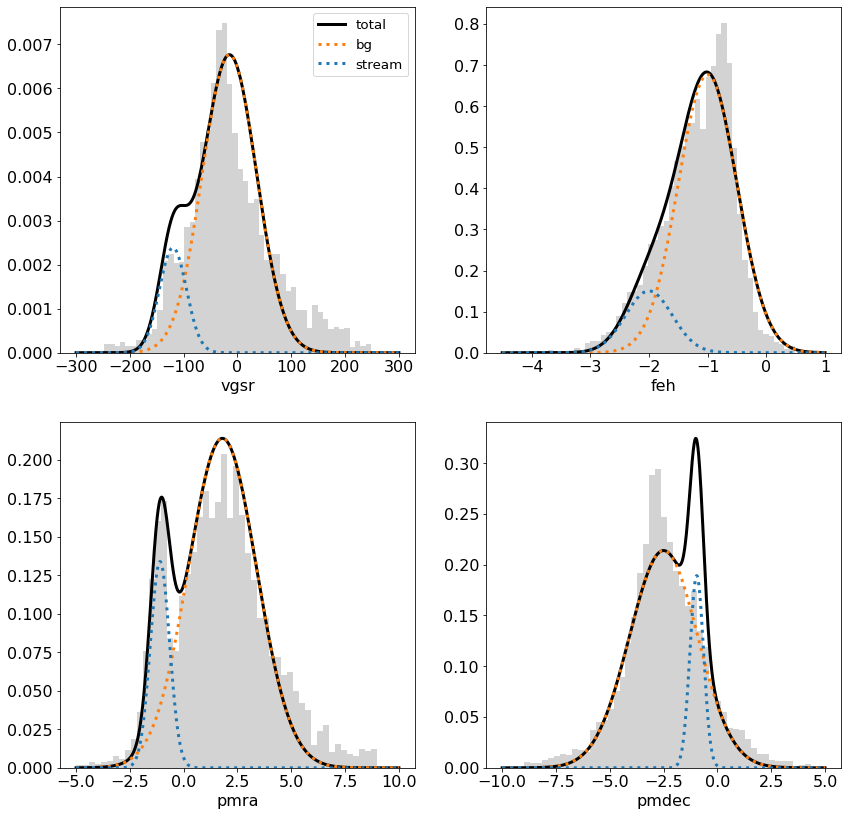

In [32]:
p0_guess = [0.15,
            -120, 0.07, 5.68, 1.4,
            -2., -0.4,
            -1.1, 0.24, 0.09, -0.35,
            -0.96, -0.02, 0.04, -0.5,
            -15, 1.7, -1, -0.3, 1.8, 0.2, -2.5, 0.2]
fig = plot_1d_distrs(p0_guess)

### 4.2 - Scipy

Now, we will use an algorithm given by `scipy` to find better parameters by minimizing the negative of probaility function. There are a few reasons to do this. Firstly, MCMC will take a long time and is rather sensitive to the starting positions, so we want to give it a good start to not waste time. Secondly, your model may not represent the data well at all, where you will find out here. Finally, this is also a good check to see that your priors and intial guess are good.

Also check the returned parameters to make sure they aren't being restricted by the prior. If the results are the initial guess form above, then your initial guess is likely to be outside your prior range, and something should be adjusted. Plot the distirbutions again. It may not look great sometimes, but just make sure that it isn't nonsensical.

In [33]:
optfunc = lambda theta: -lnprob(theta, stream_data_red['vgsr'], stream_data_red['vel_calib_std'],
                                stream_data_red['feh50'], stream_data_red['feh_calib_std'],
                                stream_data_red['pmra'], stream_data_red['pmra_error'],
                                stream_data_red['pmdec'], stream_data_red['pmdec_error'],
                                stream_data_red['phi1'],stream_data_red['pmra_pmdec_corr'])
%time result = optimize.minimize(optfunc, p0_guess, method="Nelder-Mead")
print(result.message)

output = get_paramdict(result.x)
for label, value in output.items():
    print(label, value)

CPU times: user 36.3 s, sys: 0 ns, total: 36.3 s
Wall time: 36.3 s
Maximum number of function evaluations has been exceeded.
pstream 0.028681304473340136
v1 -134.92189600404117
v2 0.2068039205538213
v3 6.3302657953719494
lsigv 0.7618275630498857
feh1 -2.1901472855243345
lsigfeh -0.4529338102375425
pmra1 -0.32424917213763793
pmra2 -0.29621598425894924
pmra3 0.08440772595539221
lsigpmra -0.8247596810089854
pmdec1 -1.0406177152088816
pmdec2 0.017093232480563044
pmdec3 0.05887465075361434
lsigpmdec -0.5397982426754453
bv -12.415770077199323
lsigbv 1.8990907489977862
bfeh -1.114138316247161
lsigbfeh -0.2946224616109734
bpmra 1.8498213673028894
lsigbpmra 0.3809480938089575
bpmdec -2.2983884057072093
lsigbpmdec 0.29748962013495783


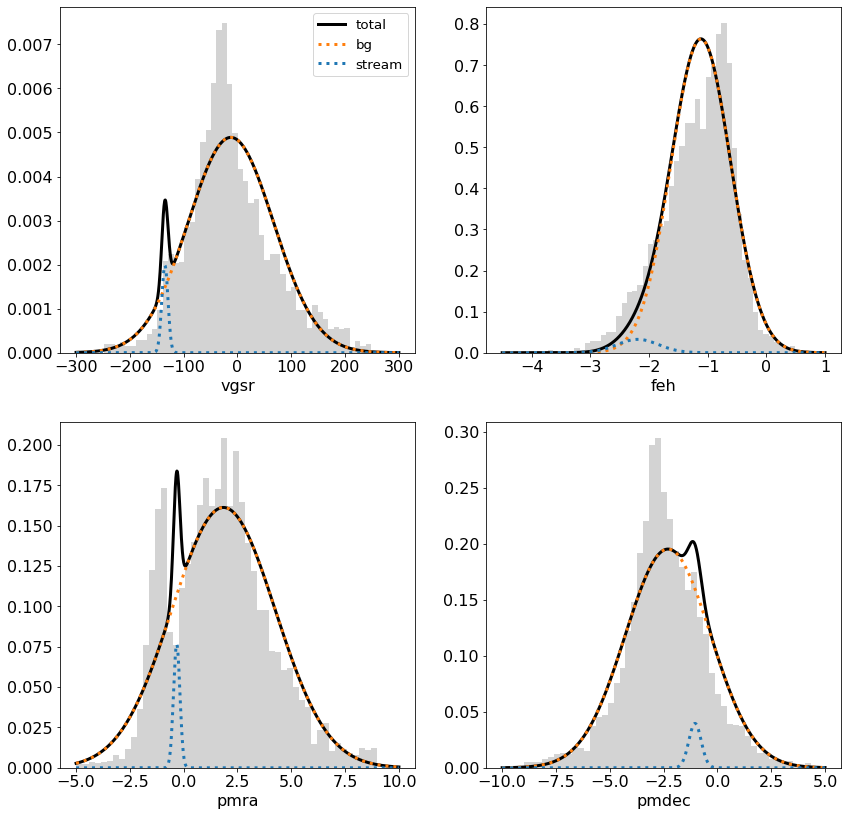

In [34]:
# Check
fig1 = plot_1d_distrs(result.x)

### 4.3 - emcee

Now we can set up the MCMC sampling. We will use 64 walkers, and randomize their starting positions by making a 23-d distribution in parameter space around the `scipy` results. In this example, I used a change of around 0.01, which might be a bit small. In general, this is meant to represent the expected uncertainties, but it isn't that important. It might be good to make this decently large so long as no walkers start outside the prior and its still near the scipy results.

In [35]:
nparams = len(param_labels)
print(nparams)

nwalkers = 64
p0 = result.x
ep0 = np.zeros(len(p0)) + 0.01
p0s = np.random.multivariate_normal(p0, np.diag(ep0)**2, size=nwalkers)

lkhds = [lnprob(p0s[j],stream_data_red['vgsr'],stream_data_red['vel_calib_std'],
                stream_data_red['feh50'],stream_data_red['feh_calib_std'],
                stream_data_red['pmra'],stream_data_red['pmra_error'],
                stream_data_red['pmdec'],stream_data_red['pmdec_error'],
                stream_data_red['phi1'],stream_data_red['pmra_pmdec_corr']) for j in range(nwalkers)]

assert np.all(np.array(lkhds) > -9e9)

23


To save the chains, we need to define a backend and clear it to overwrite any previous files.

In [36]:
backend = emcee.backends.HDFBackend('aau_chains.h5')
backend.reset(nwalkers,23)

Now we run the sampler. It is highly recommended to run the sampler in parallel across multiple cores since this step takes a very long time. Both `multiprocessing` and `schwimmbad` can accomplish this. I will be using 32 cores for this and 2000 steps for each walker.

In [37]:
%%time 
from multiprocessing import Pool

# from schwimmbad import MultiPool
# with MultiPool(nproc) as pool:

## Run emcee in parallel
nproc = 32
nstep = 2000

with Pool(nproc) as pool:
    print("Running burnin with {} iterations".format(nstep))
    start = time.time()
    es = emcee.EnsembleSampler(
        nwalkers, len(p0), lnprob,
        args=(stream_data_red['vgsr'],stream_data_red['vel_calib_std'],
              stream_data_red['feh50'],stream_data_red['feh_calib_std'],
              stream_data_red['pmra'],stream_data_red['pmra_error'],
              stream_data_red['pmdec'],stream_data_red['pmdec_error'],
              stream_data_red['phi1'],stream_data_red['pmra_pmdec_corr']),
        pool=pool,backend=backend)
    PP = es.run_mcmc(p0s, nstep)
    print("Took {:.1f} seconds".format(time.time()-start))
    
    print(f"Now running the actual thing")
    es.reset()
    start = time.time()
    es.run_mcmc(PP.coords, nstep)
    print("Took {:.1f} seconds".format(time.time()-start))
    
    chain = es.chain

Running burnin with 2000 iterations
Took 301.7 seconds
Now running the actual thing
Took 285.7 seconds
CPU times: user 4min 39s, sys: 1min, total: 5min 39s
Wall time: 9min 47s


Now we can take a look to see if the chains converge properly. If you are reading the chains from the file, the array is shaped differently.

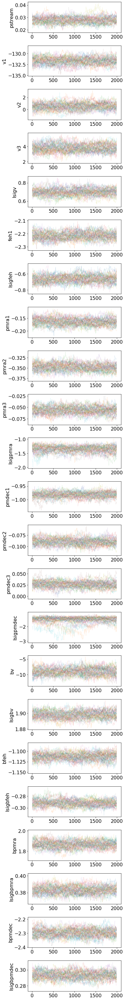

In [38]:
Nrow = chain.shape[2]
fig, axes = plt.subplots(Nrow, figsize=(6,2*Nrow))
for iparam,ax in enumerate(axes):
    for j in range(nwalkers):
        ax.plot(chain[j,:,iparam], lw=.5, alpha=.2)
        ax.set_ylabel(param_labels[iparam])
fig.tight_layout()

We can get the flatchain to view the distribution of points traversed in each parameter space. A corner plot can also be generated this way to see if the results are good.

In [39]:
flatchain = es.flatchain
flatchain.shape

(128000, 23)

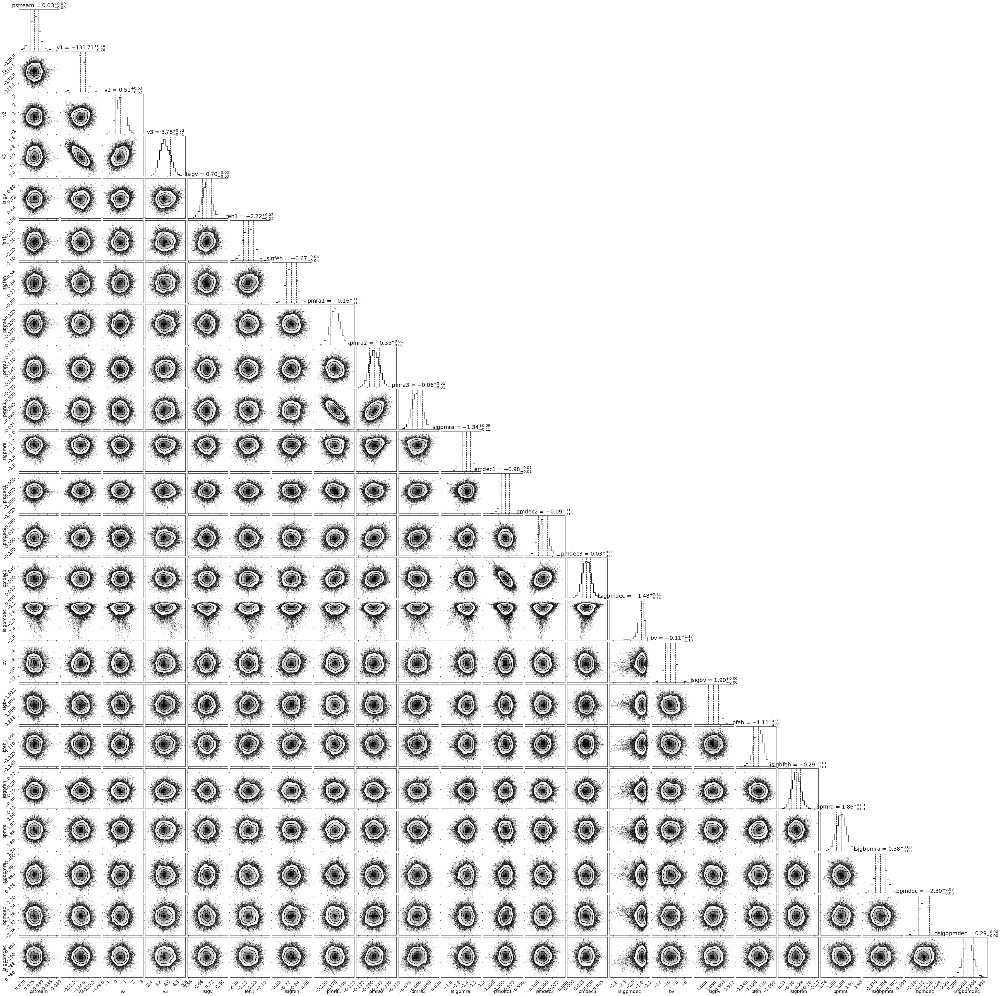

In [40]:
fig = corner.corner(flatchain, labels=param_labels, quantiles=[0.16,0.50,0.84], show_titles=True)

The following function will process the chain and return the optimal paramters and their errors.

In [41]:
def process_chain(chain, avg_error=True):
    ''' Returns the means and errors of teh parameters
    
    Parameters:
    chain - array. The chain
    avg_error - bool. Will average the + and - errors if True
    
    Return:
    2 or 3 OrderedDict as a tuple. means, errors or means, errors+, errors-
    '''
    pctl = np.percentile(chain, [16, 50, 84], axis=0)
    meds = pctl[1]
    ep = pctl[2]-pctl[1]
    em = pctl[0]-pctl[1]
    if avg_error: # just for simplicity, assuming no asymmetry
        err = (ep-em)/2
        return OrderedDict(zip(param_labels, meds)), OrderedDict(zip(param_labels, err))
    else:
        return OrderedDict(zip(param_labels, meds)), OrderedDict(zip(param_labels, ep)), OrderedDict(zip(param_labels, em))

In [42]:
meds, errs = process_chain(flatchain)

In [43]:
i = 0
for k,v in meds.items():
    if k[0] == 'l':
        print("{} {:.3f} {:.3f}".format(k[1:], 10**v, np.log(10)*(10**v)*errs[k]))
    else:
        print("{} {:.3f} {:.3f}".format(k, v, errs[k]))
    i += 1

pstream 0.028 0.002
v1 -131.707 0.751
v2 0.512 0.523
v3 3.778 0.487
sigv 4.991 0.391
feh1 -2.217 0.027
sigfeh 0.216 0.021
pmra1 -0.164 0.013
pmra2 -0.348 0.008
pmra3 -0.057 0.008
sigpmra 0.046 0.011
pmdec1 -0.982 0.010
pmdec2 -0.089 0.007
pmdec3 0.026 0.006
sigpmdec 0.033 0.010
bv -9.107 1.133
sigbv 79.042 0.792
bfeh -1.113 0.008
sigbfeh 0.511 0.006
bpmra 1.864 0.032
sigbpmra 2.415 0.023
bpmdec -2.298 0.026
sigbpmdec 1.964 0.020


One final check, then if all is good we can save the parameters.

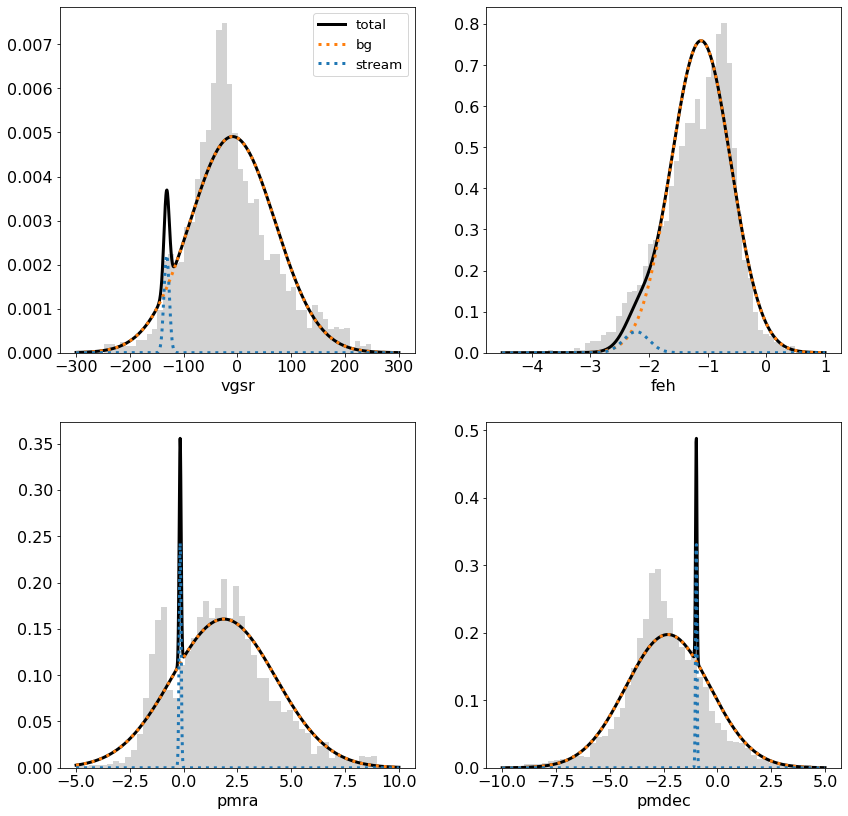

In [44]:
theta_final = []
for _,i in meds.items():
    theta_final.append(i)
fig1 = plot_1d_distrs(theta_final)

In [45]:
np.savetxt('aau_params.txt',np.array(theta_final))

## 5 - Membership probability

To calculate membership probability, we need to divide the likelihood of the stream component divided by the likelihood of the stream component and the background component both scaled by `pstream` accordingly.

In [46]:
def memprob(theta, vgsr, vgsr_err, feh, feh_err, pmra, pmra_err, pmdec, pmdec_err, phi1, pmcorr):
    """ Calculates membership probability based on inputs
    
    Parameters:
    theta - array. model parameters
    vgsr, pmra, pmdec, phi1 - floats. Respective values
    
    Return:
    float. The membership probability
    """
    # params
    pstream, \
    v1, v2, v3, lsigv, \
    feh1, lsigfeh, \
    pmra1, pmra2, pmra3, lsigpmra, \
    pmdec1, pmdec2, pmdec3, lsigpmdec, \
    bv, lsigbv, bfeh, lsigbfeh, bpmra, lsigbpmra, bpmdec, lsigbpmdec = theta
    
    ## Compute log likelihood in v_gsr
    lstream_v = stats.norm.logpdf(vgsr, loc=quad_f(phi1,v1,v2,v3), scale=np.sqrt(vgsr_err**2+(10**lsigv)**2))
    lbg_v = stats.norm.logpdf(vgsr, loc=bv, scale=np.sqrt(vgsr_err**2+(10**lsigbv)**2))
    
    ## Compute log likelihood in feh
    lstream_feh = stats.norm.logpdf(feh, loc=feh1, scale=np.sqrt(feh_err**2+(10**lsigfeh)**2))
    lbg_feh = stats.norm.logpdf(feh, loc=bfeh, scale=np.sqrt(feh_err**2+(10**lsigbfeh)**2))
    
    ## Compute log likelihood in pm
    
    lstream_pm = logpdf_2dnorm(pmra,pmdec,
                               quad_f(phi1,pmra1,pmra2,pmra3),quad_f(phi1,pmdec1,pmdec2,pmdec3),
                               np.sqrt(pmra_err**2+(10**lsigpmra)**2),np.sqrt(pmdec_err**2+(10**lsigpmdec)**2),
                               pmcorr)
    lbg_pm = logpdf_2dnorm(pmra,pmdec,
                               bpmra,bpmdec,
                               np.sqrt(pmra_err**2+(10**lsigbpmra)**2),np.sqrt(pmdec_err**2+(10**lsigbpmdec)**2),
                               pmcorr)

    ## Combine the components
    lstream = np.log(pstream) + lstream_v + lstream_feh + lstream_pm
    lbg = np.log(1-pstream) + lbg_v + lbg_feh + lbg_pm
    
    stream = np.exp(lstream)
    bg = np.exp(lbg)
    
    p = stream/(stream+bg)
    return p

In [47]:
stream_prob = memprob(theta_final,stream_data_red['vgsr'],stream_data_red['vel_calib_std'],
                      stream_data_red['feh50'],stream_data_red['feh_calib_std'],
                      stream_data_red['pmra'],stream_data_red['pmra_error'],
                      stream_data_red['pmdec'],stream_data_red['pmdec_error'],
                      stream_data_red['phi1'],stream_data_red['pmra_pmdec_corr'])

Arbitrarily choosing `p>0.7` to be the criteria, we find 117 members of the AAU stream. The histogram below shows the distirbution of membership probability on a log scale.

In [48]:
# Taking all p > threshold to be in the stream
threshold = 0.7

# number of members
print(len(stream_prob[stream_prob>threshold]))

142


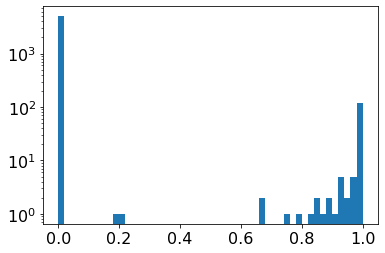

In [49]:
plt.hist(stream_prob,bins=50)
plt.yscale('log')

We will save the stars with `p>0.1` along with their membership probabilties to .csv and .fits files.

In [50]:
stream_data_final = stream_data_red[stream_prob>0.1]
stream_data_final['mp'] = stream_prob[stream_prob>0.1]

In [51]:
stream_data_final.write('aau_members.csv', format='ascii', overwrite=True)
stream_data_final.write('aau_members.fits', format='fits', overwrite=True)

## 6 - Figures

Below are some useful and interesting figures.

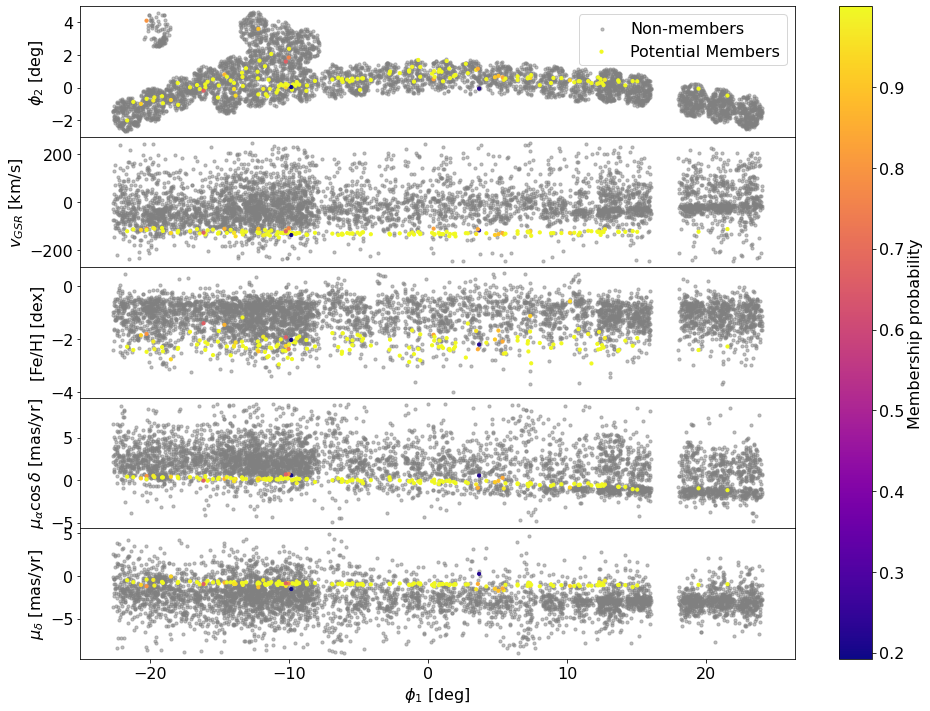

In [52]:
fig, ax = plt.subplots(5,1,figsize=(16,12),sharex=True)

ax[0].scatter(stream_data_red['phi1'][stream_prob<=0.1], stream_data_red['phi2'][stream_prob<=0.1],
              color='gray',alpha=0.5,label='Non-members',s=10)
cm = ax[0].scatter(stream_data_red['phi1'][stream_prob>0.1], stream_data_red['phi2'][stream_prob>0.1],
                   c=stream_prob[stream_prob>0.1],cmap='plasma',label='Potential Members',s=10)

ax[1].scatter(stream_data_red['phi1'][stream_prob<=0.1], stream_data_red['vgsr'][stream_prob<=0.1],
              color='gray',alpha=0.5,s=10)
ax[1].scatter(stream_data_red['phi1'][stream_prob>0.1], stream_data_red['vgsr'][stream_prob>0.1],
              c=stream_prob[stream_prob>0.1],s=10,cmap='plasma')

ax[2].scatter(stream_data_red['phi1'][stream_prob<=0.1], stream_data_red['feh50'][stream_prob<=0.1],
              color='gray',alpha=0.5,s=10)
ax[2].scatter(stream_data_red['phi1'][stream_prob>0.1], stream_data_red['feh50'][stream_prob>0.1],
              c=stream_prob[stream_prob>0.1],s=10,cmap='plasma')

ax[3].scatter(stream_data_red['phi1'][stream_prob<=0.1], stream_data_red['pmra'][stream_prob<=0.1],
              color='gray',s=10,alpha=0.5)
ax[3].scatter(stream_data_red['phi1'][stream_prob>0.1], stream_data_red['pmra'][stream_prob>0.1],
              c=stream_prob[stream_prob>0.1],s=10,cmap='plasma')

ax[4].scatter(stream_data_red['phi1'][stream_prob<=0.1], stream_data_red['pmdec'][stream_prob<=0.1],
              s=10,color='gray',alpha=0.5)
ax[4].scatter(stream_data_red['phi1'][stream_prob>0.1], stream_data_red['pmdec'][stream_prob>0.1],
              s=10,c=stream_prob[stream_prob>0.1],cmap='plasma')


ax[0].set_ylabel('$\phi_2$ [deg]')
ax[1].set(ylabel=r'$v_{GSR}$ [km/s]')
ax[2].set(ylabel=r'[Fe/H] [dex]')
ax[3].set(ylabel=r'$\mu_{\alpha} \cos\delta$ [mas/yr]')
ax[4].set(xlabel="$\phi_1$ [deg]",ylabel='$\mu_\delta$ [mas/yr]')
plt.subplots_adjust(hspace=0)
ax[0].legend()


fig.colorbar(cm, ax=ax.ravel().tolist(),label='Membership probability')

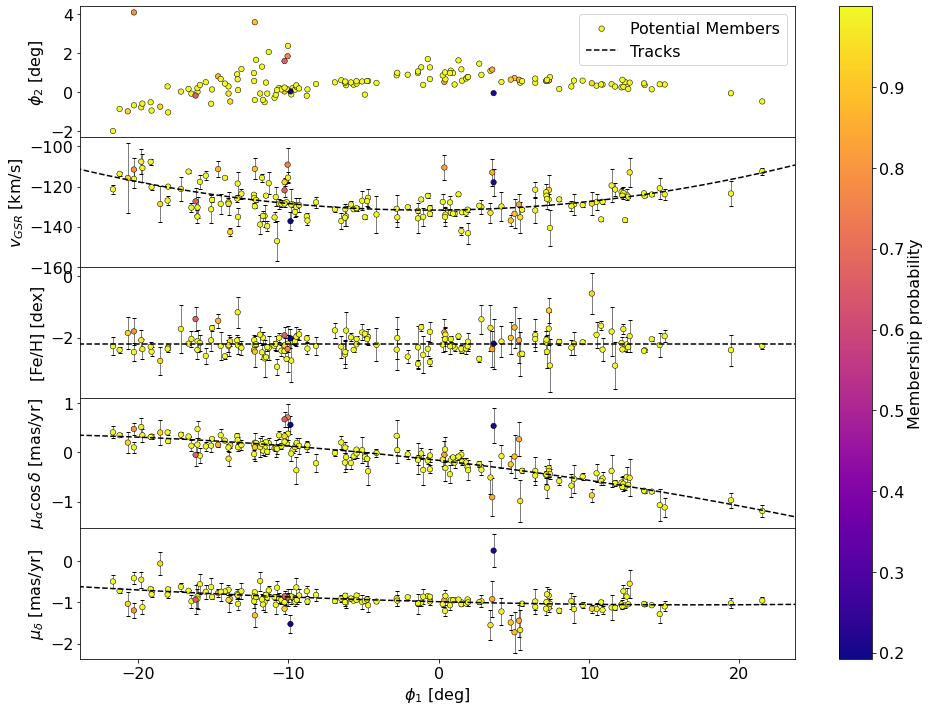

In [53]:
fig, ax = plt.subplots(5,1,figsize=(16,12),sharex=True)
cm = ax[0].scatter(stream_data_red['phi1'][stream_prob>0.1], stream_data_red['phi2'][stream_prob>0.1],c=stream_prob[stream_prob>0.1],cmap='plasma',
              label='Potential Members',s=30,linewidth=0.5,edgecolors='k',zorder=1)

ax[1].scatter(stream_data_red['phi1'][stream_prob>0.1], stream_data_red['vgsr'][stream_prob>0.1],
              c=stream_prob[stream_prob>0.1],s=30,cmap='plasma',linewidth=0.5,edgecolors='k',zorder=1)

ax[2].scatter(stream_data_red['phi1'][stream_prob>0.1], stream_data_red['feh50'][stream_prob>0.1],
              c=stream_prob[stream_prob>0.1],s=30,cmap='plasma',linewidth=0.5,edgecolors='k',zorder=1)

ax[3].scatter(stream_data_red['phi1'][stream_prob>0.1], stream_data_red['pmra'][stream_prob>0.1],
              c=stream_prob[stream_prob>0.1],s=30,cmap='plasma',linewidth=0.5,edgecolors='k',zorder=1)

ax[4].scatter(stream_data_red['phi1'][stream_prob>0.1], stream_data_red['pmdec'][stream_prob>0.1],
              s=30,c=stream_prob[stream_prob>0.1],cmap='plasma',linewidth=0.5,edgecolors='k',zorder=1)


ax[1].errorbar(stream_data_red['phi1'][stream_prob>0.1],
            stream_data_red['vgsr'][stream_prob>0.1],
            yerr=stream_data_red['vel_calib_std'][stream_prob>0.1],
            ms=0,fmt='o',mfc='none',ecolor='k',capsize=2,elinewidth=0.5,zorder=0)

ax[2].errorbar(stream_data_red['phi1'][stream_prob>0.1],
            stream_data_red['feh50'][stream_prob>0.1],
            yerr=stream_data_red['feh_calib_std'][stream_prob>0.1],
            ms=0,fmt='o',mfc='none',ecolor='k',capsize=2,elinewidth=0.5,zorder=0)

ax[3].errorbar(stream_data_red['phi1'][stream_prob>0.1],
            stream_data_red['pmra'][stream_prob>0.1],
            yerr=stream_data_red['pmra_error'][stream_prob>0.1],
            ms=0,fmt='o',mfc='none',ecolor='k',capsize=2,elinewidth=0.5,zorder=0)

ax[4].errorbar(stream_data_red['phi1'][stream_prob>0.1],
            stream_data_red['pmdec'][stream_prob>0.1],
            yerr=stream_data_red['pmdec_error'][stream_prob>0.1],
            ms=0,fmt='o',mfc='none',ecolor='k',capsize=2,elinewidth=0.5,zorder=0)



xr = ax[0].get_xlim()
yr0 = ax[0].get_ylim()
yr1 = ax[1].get_ylim()
yr2 = ax[2].get_ylim()
yr3 = ax[3].get_ylim()
yr4 = ax[4].get_ylim()

x_arr = np.linspace(-30,30,200)

ax[0].plot(x_arr,quad_f(x_arr,meds['v1'],meds['v2'],meds['v3']),color='k',ls='--',label='Tracks')
ax[0].set_ylim(-0.9,1.6)
ax[1].plot(x_arr,quad_f(x_arr,meds['v1'],meds['v2'],meds['v3']),color='k',ls='--')
ax[2].plot(x_arr,meds['feh1']*np.ones(200),color='k',ls='--')
ax[3].plot(x_arr,quad_f(x_arr,meds['pmra1'],meds['pmra2'],meds['pmra3']),color='k',ls='--')
ax[4].plot(x_arr,quad_f(x_arr,meds['pmdec1'],meds['pmdec2'],meds['pmdec3']),color='k',ls='--')

ax[0].set(ylabel='$\phi_2$ [deg]',xlim=xr,ylim=yr0)
ax[1].set(ylabel=r'$v_{GSR}$ [km/s]',ylim=yr1)
ax[2].set(ylabel=r'[Fe/H] [dex]',ylim=yr2)
ax[3].set(ylabel=r'$\mu_{\alpha} \cos\delta$ [mas/yr]',ylim=yr3)
ax[4].set(xlabel="$\phi_1$ [deg]",ylabel='$\mu_\delta$ [mas/yr]',ylim=yr4)
plt.subplots_adjust(hspace=0)
ax[0].legend()

fig.colorbar(cm, ax=ax.ravel().tolist(),label='Membership probability')

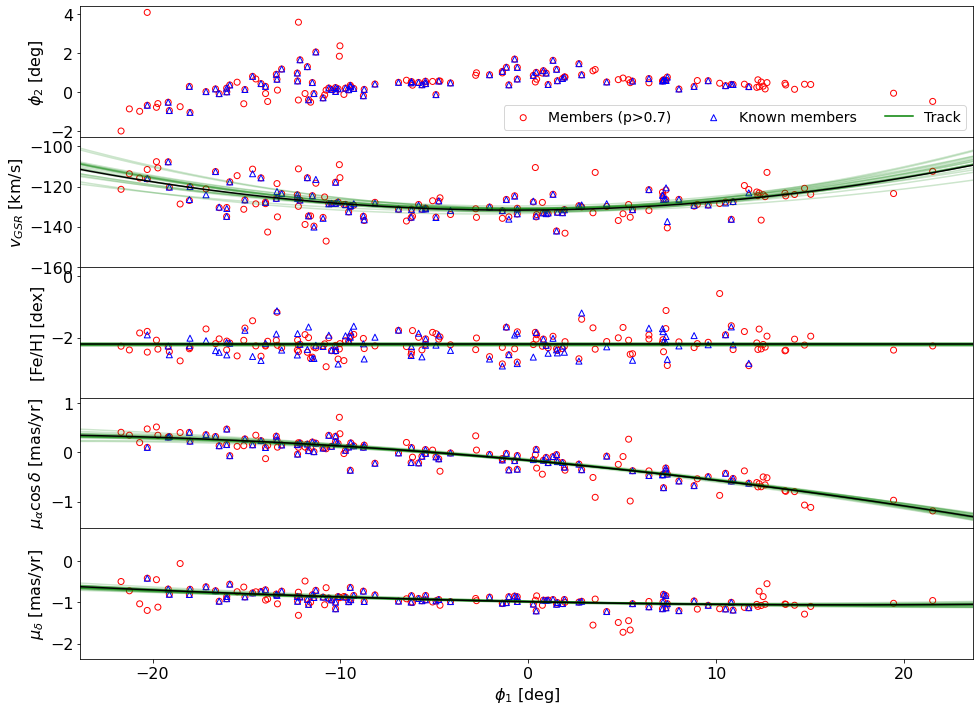

In [54]:
fig, ax = plt.subplots(5,1,figsize=(16,12),sharex=True)

ax[0].scatter(stream_data_red['phi1'][stream_prob>0.7], stream_data_red['phi2'][stream_prob>0.7],
              facecolors='none', edgecolors='r',label=f'Members (p>{threshold})')
ax[0].scatter(stream_mem['phi1'], stream_mem['phi2'],facecolors='none',edgecolors='b',label='Known members',marker='^')

ax[1].scatter(stream_data_red['phi1'][stream_prob>0.7], stream_data_red['vgsr'][stream_prob>0.7],
              facecolors='none', edgecolors='r')
ax[1].scatter(stream_mem['phi1'], stream_mem['vgsr'],facecolors='none',edgecolors='b',marker='^')

ax[2].scatter(stream_data_red['phi1'][stream_prob>0.7], stream_data_red['feh50'][stream_prob>0.7],
              facecolors='none', edgecolors='r')
ax[2].scatter(stream_mem['phi1'], stream_mem['feh50'],facecolors='none',edgecolors='b',marker='^')

ax[3].scatter(stream_data_red['phi1'][stream_prob>0.7], stream_data_red['pmra'][stream_prob>0.7],
              facecolors='none', edgecolors='r')
ax[3].scatter(stream_mem['phi1'], stream_mem['pmra'],facecolors='none',edgecolors='b',marker='^')

ax[4].scatter(stream_data_red['phi1'][stream_prob>0.7], stream_data_red['pmdec'][stream_prob>0.7],
              facecolors='none', edgecolors='r')
ax[4].scatter(stream_mem['phi1'], stream_mem['pmdec'],facecolors='none',edgecolors='b',marker='^')


for i in range(20):
    ax[1].plot(x_arr,quad_f(x_arr,
                            np.random.choice(flatchain[:,param_labels.index('v1')]),
                            np.random.choice(flatchain[:,param_labels.index('v2')]),
                            np.random.choice(flatchain[:,param_labels.index('v3')])),
               color='g',alpha=0.2)
    ax[2].plot(x_arr,np.random.choice(flatchain[:,param_labels.index('feh1')])*np.ones(200),
               color='g',alpha=0.2)
    ax[3].plot(x_arr,quad_f(x_arr,
                            np.random.choice(flatchain[:,param_labels.index('pmra1')]),
                            np.random.choice(flatchain[:,param_labels.index('pmra2')]),
                            np.random.choice(flatchain[:,param_labels.index('pmra3')])),
               color='g',alpha=0.2)
    ax[4].plot(x_arr,quad_f(x_arr,
                            np.random.choice(flatchain[:,param_labels.index('pmdec1')]),
                            np.random.choice(flatchain[:,param_labels.index('pmdec2')]),
                            np.random.choice(flatchain[:,param_labels.index('pmdec3')])),
               color='g',alpha=0.2)


ax[1].plot(x_arr,quad_f(x_arr,meds['v1'],meds['v2'],meds['v3']),color='k')
ax[2].plot(x_arr,meds['feh1']*np.ones(200),color='k')
ax[3].plot(x_arr,quad_f(x_arr,meds['pmra1'],meds['pmra2'],meds['pmra3']),color='k')
ax[4].plot(x_arr,quad_f(x_arr,meds['pmdec1'],meds['pmdec2'],meds['pmdec3']),color='k')

ax[0].plot(x_arr,10*np.ones(len(x_arr)),color='g',label='Track')
    


ax[0].set(ylabel='$\phi_2$ [deg]',xlim=xr,ylim=yr0)
ax[1].set(ylabel=r'$v_{GSR}$ [km/s]',ylim=yr1)
ax[2].set(ylabel=r'[Fe/H] [dex]',ylim=yr2)
ax[3].set(ylabel=r'$\mu_{\alpha} \cos\delta$ [mas/yr]',ylim=yr3)
ax[4].set(xlabel="$\phi_1$ [deg]",ylabel='$\mu_\delta$ [mas/yr]',ylim=yr4)
plt.subplots_adjust(hspace=0)

ax[0].legend(ncol=4,loc=4,prop={'size':14})

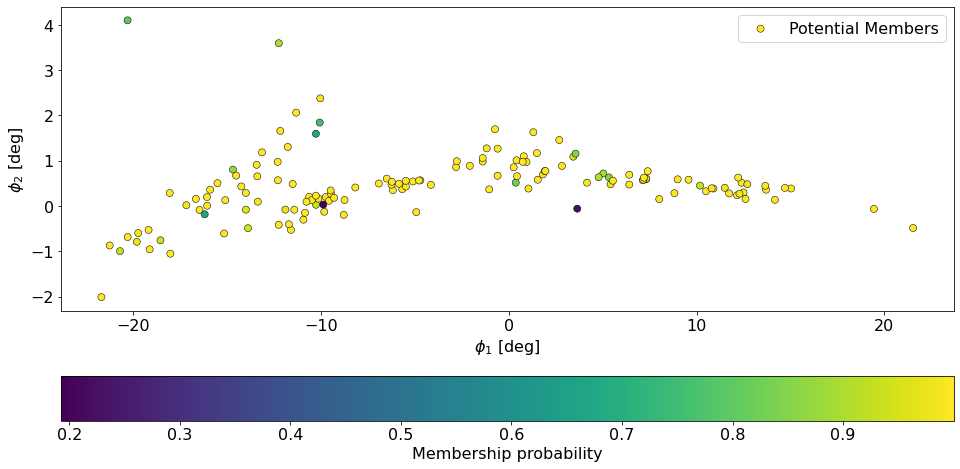

In [55]:
fig, ax = plt.subplots(figsize=(16,8),sharex=True)

cm = ax.scatter(stream_data_red['phi1'][stream_prob>0.1], stream_data_red['phi2'][stream_prob>0.1],c=stream_prob[stream_prob>0.1],
              label='Potential Members',s=50,linewidth=0.5,edgecolor='k')

ax.set(xlabel="$\phi_1$ [deg]",ylabel='$\phi_2$ [deg]')
plt.subplots_adjust(hspace=0)
ax.legend()

fig.colorbar(cm,orientation="horizontal",label='Membership probability')

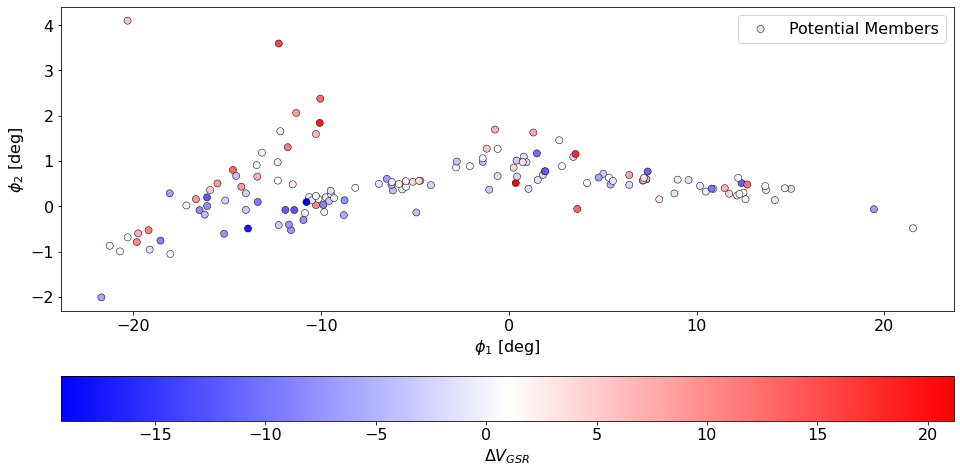

In [56]:
fig, ax = plt.subplots(figsize=(16,8),sharex=True)

cm = ax.scatter(stream_data_red['phi1'][stream_prob>0.1],
                stream_data_red['phi2'][stream_prob>0.1],
                c=stream_data_red['vgsr'][stream_prob>0.1]-quad_f(stream_data_red['phi1'][stream_prob>0.1],
                                                                 meds['v1'],meds['v2'],meds['v3']),
              label='Potential Members',s=50,cmap='bwr',linewidth=0.5,edgecolors='k')

ax.set(xlabel="$\phi_1$ [deg]",ylabel='$\phi_2$ [deg]')
plt.subplots_adjust(hspace=0)
ax.legend()

fig.colorbar(cm,orientation="horizontal",label=r'$\Delta V_{GSR}$')

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


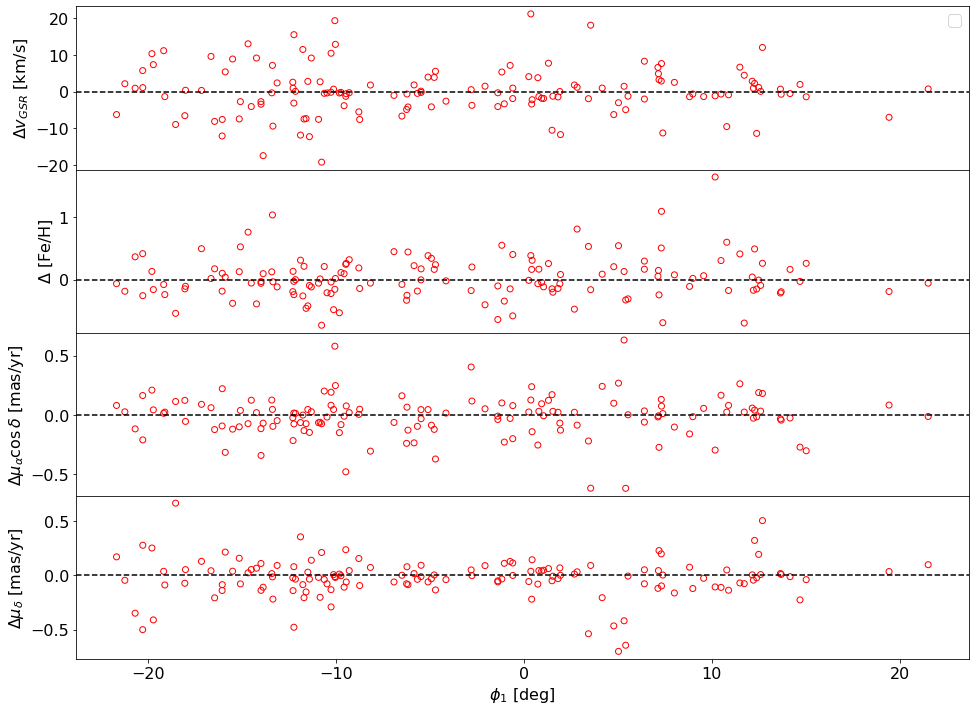

In [57]:
fig, ax = plt.subplots(4,1,figsize=(16,12),sharex=True)

ax[0].scatter(stream_data_red['phi1'][stream_prob>0.7],
              stream_data_red['vgsr'][stream_prob>0.7]-quad_f(stream_data_red['phi1'][stream_prob>0.7],
                                                             meds['v1'],meds['v2'],meds['v3']),
              facecolors='none', edgecolors='r')

ax[1].scatter(stream_data_red['phi1'][stream_prob>0.7],
              stream_data_red['feh50'][stream_prob>0.7]-meds['feh1']*np.ones(len(stream_prob[stream_prob>0.7])),
              facecolors='none', edgecolors='r')

ax[2].scatter(stream_data_red['phi1'][stream_prob>0.7],
              stream_data_red['pmra'][stream_prob>0.7]-quad_f(stream_data_red['phi1'][stream_prob>0.7],
                                                             meds['pmra1'],meds['pmra2'],meds['pmra3']),
              facecolors='none', edgecolors='r')

ax[3].scatter(stream_data_red['phi1'][stream_prob>0.7],
              stream_data_red['pmdec'][stream_prob>0.7]-quad_f(stream_data_red['phi1'][stream_prob>0.7],
                                                             meds['pmdec1'],meds['pmdec2'],meds['pmdec3']),
              facecolors='none', edgecolors='r')

ax[0].axhline(0,ls='--',color='k')
ax[1].axhline(0,ls='--',color='k')
ax[2].axhline(0,ls='--',color='k')
ax[3].axhline(0,ls='--',color='k')

ax[0].set(ylabel=r'$\Delta v_{GSR}$ [km/s]')
ax[1].set(ylabel=r'$\Delta $ [Fe/H]')
ax[2].set(ylabel=r'$\Delta \mu_{\alpha} \cos\delta$ [mas/yr]')
ax[3].set(xlabel="$\phi_1$ [deg]",ylabel='$\Delta \mu_\delta$ [mas/yr]')
plt.subplots_adjust(hspace=0)
ax[0].legend()

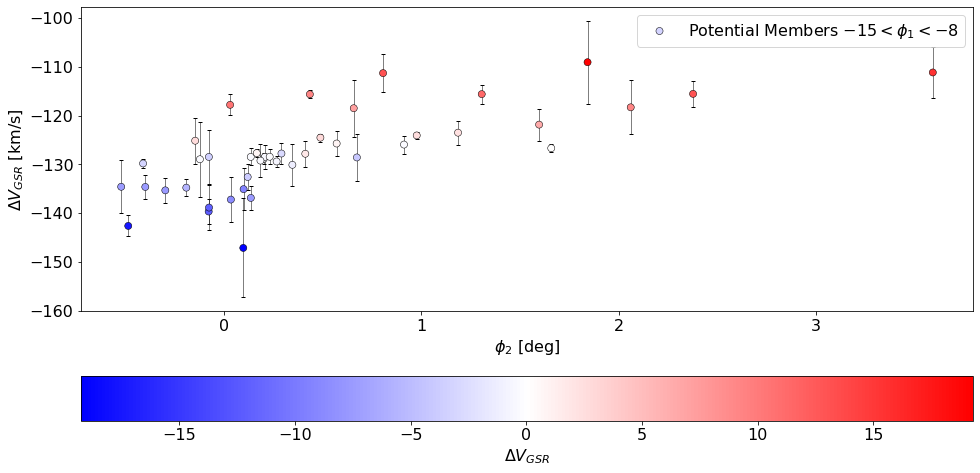

In [58]:
fig, ax = plt.subplots(figsize=(16,8),sharex=True)

cond = (stream_prob>0.1) & (stream_data_red['phi1']<-8) & (stream_data_red['phi1']>-15)



ax.errorbar(stream_data_red['phi2'][cond],
            stream_data_red['vgsr'][cond],
            yerr=stream_data_red['vel_calib_std'][cond],
            ms=0,fmt='o',mfc='none',ecolor='k',capsize=2,elinewidth=0.5,zorder=0)


cm = ax.scatter(stream_data_red['phi2'][cond],
                stream_data_red['vgsr'][cond],
                c=stream_data_red['vgsr'][cond]-quad_f(stream_data_red['phi1'][cond],
                                                                 meds['v1'],meds['v2'],meds['v3']),
              label=r'Potential Members $-15<\phi_1<-8$',s=50,cmap='bwr',linewidth=0.5,edgecolors='k',zorder=1)

ax.set(xlabel="$\phi_2$ [deg]",ylabel='$\Delta V_{GSR}$ [km/s]')
plt.subplots_adjust(hspace=0)
ax.legend()

fig.colorbar(cm,orientation="horizontal",label=r'$\Delta V_{GSR}$')

In [59]:
# Color correction

stream_data_red['gmag0'] = stream_data_red['decam_g'] - stream_data_red['ebv'] * 3.186
stream_data_red['rmag0'] = stream_data_red['decam_r'] - stream_data_red['ebv'] * 2.140
stream_data_red['zmag0'] = stream_data_red['decam_z'] - stream_data_red['ebv'] * 1.196

stream_mem['gmag0'] = stream_mem['decam_g'] - stream_mem['ebv'] * 3.186
stream_mem['rmag0'] = stream_mem['decam_r'] - stream_mem['ebv'] * 2.140
stream_mem['zmag0'] = stream_mem['decam_z'] - stream_mem['ebv'] * 1.196

In [60]:
#pick a dotter isochrone (check the file for metallicity of the isochrone)
isofile_mp = '../data/iso_00011.dat'
dotter_mp = np.loadtxt(isofile_mp)
dotter_g_mp = dotter_mp[:,6]
dotter_r_mp = dotter_mp[:,7]

# build the BHB using empirical data from M92
dm_m92_harris = 14.59 #dm of M92
m92ebv = 0.023
m92ag = m92ebv * 3.184
m92ar = m92ebv * 2.130
m92_hb_r = np.array([17.3, 15.8, 15.38, 15.1, 15.05, 15.05, 15.05])
m92_hb_col = np.array([-0.39, -0.3, -0.2, -0.0, 0.1,0.2,0.5])
m92_hb_g = m92_hb_r + m92_hb_col
des_m92_hb_g = m92_hb_g - 0.104 * (m92_hb_g - m92_hb_r) + 0.01
des_m92_hb_r = m92_hb_r - 0.102 * (m92_hb_g - m92_hb_r) + 0.02
des_m92_hb_g = des_m92_hb_g - m92ag - dm_m92_harris
des_m92_hb_r = des_m92_hb_r - m92ar - dm_m92_harris

dotter_g, dotter_r = dotter_g_mp, dotter_r_mp #use the metal-poor isochrone

d = 23.8 #assume stream is at this distance in kpc
dm = 5*np.log10(d*1000)-5 # convert from distance in kpc to distance modulu

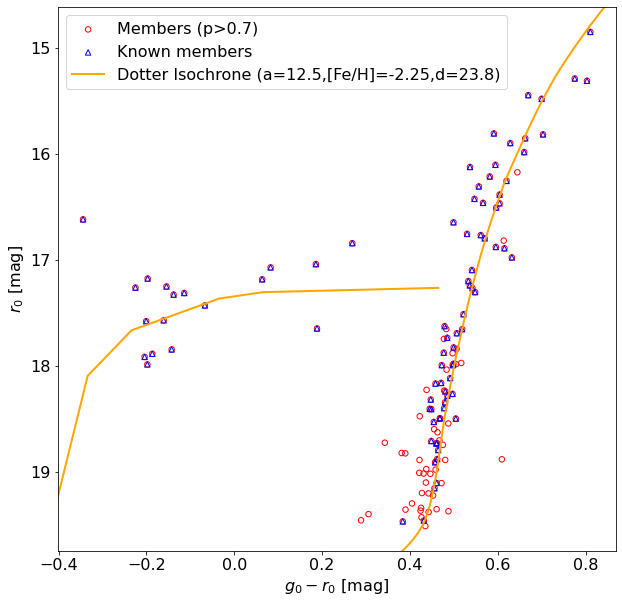

In [61]:
fig, ax = plt.subplots(figsize=(10,10),sharex=True)

ax.scatter(stream_data_red['gmag0'][stream_prob>0.7]-stream_data_red['rmag0'][stream_prob>0.7],
           stream_data_red['rmag0'][stream_prob>0.7],s=30,color='r',marker='o',facecolors='none',
           label='Members (p>0.7)')

ax.scatter(stream_mem['gmag0']-stream_mem['rmag0'],
           stream_mem['rmag0'],s=30,color='b',marker='^',facecolors='none',
           label='Known members')

plt.gca().invert_yaxis()
xrange = ax.get_xlim()
yrange = ax.get_ylim()

ax.plot(dotter_g-dotter_r, dotter_r+dm,lw=2,color='orange',label=f'Dotter Isochrone (a=12.5,[Fe/H]=-2.25,d={d})')
ax.plot(des_m92_hb_g-des_m92_hb_r, des_m92_hb_r+dm, lw=2, color='orange')

ax.set(xlabel='$g_0-r_0$ [mag]',ylabel='$r_0$ [mag]')
ax.set(xlim=xrange,ylim=yrange)

ax.legend()